# 3D Scene Reconstruction via Smartphone Camera Triangulation


**This project was developed for EE417 – Computer Vision course at Sabancı University**

**Submitted by: İpek Akkuş - ipek.akkus@sabanciuniv.edu**

**Date: 20.05.2025**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###1- Image Capture

*In this section, we load high-resolution images captured using a smartphone. These images represent slightly different viewpoints of a static scene. A minimum of 60% overlap is ensured to support accurate stereo matching. The images are displayed for verification.*

4 images are captured and located in the following path.

In [ ]:
import glob
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Load image paths from the specified directory (JPEG format)
# These images are used for stereo reconstruction and/or calibration
image_folder = '/content/drive/My Drive/EE 417/THE 3/dataset'
image_paths = glob.glob(os.path.join(image_folder, '*.jpeg'))  # or .jpeg

print("Found", len(image_paths), "images for calibration.\n")

Found 4 images for calibration.



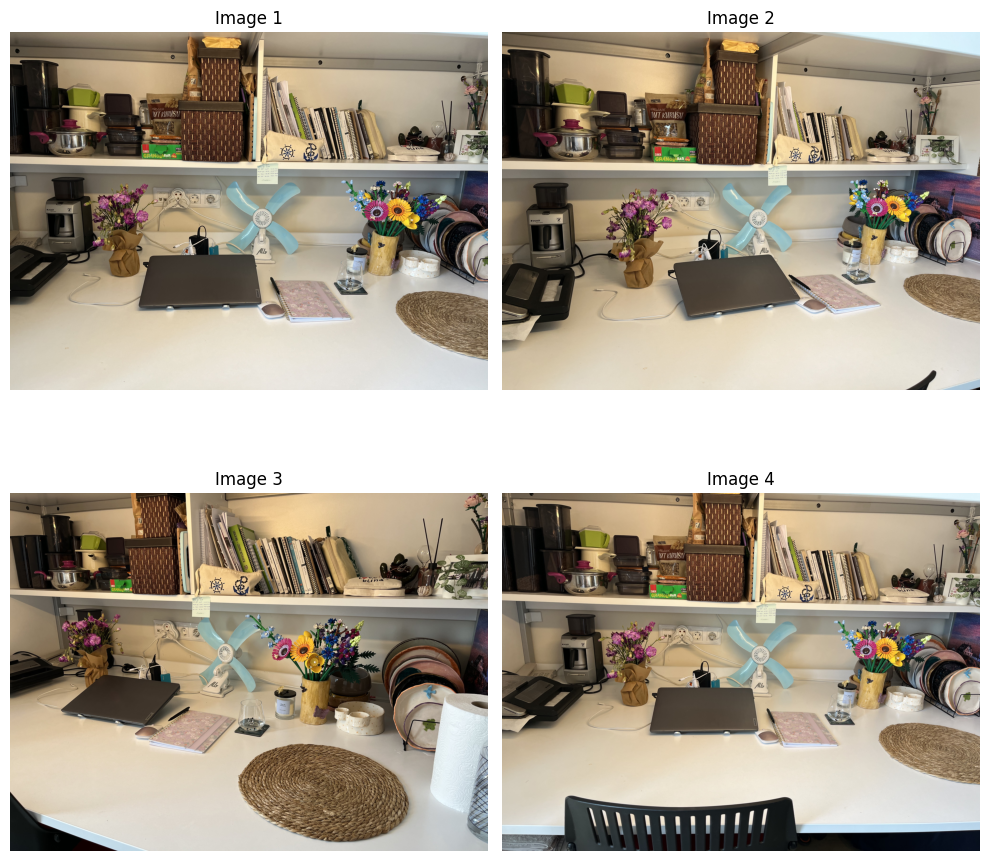

In [ ]:
plt.figure(figsize=(10, 10))
for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)
    # Convert the image from BGR to RGB for displaying with matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 2, i + 1)  # Adjust subplot layout based on the number of images
    plt.imshow(img_rgb)
    plt.title(f"Image {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

The visualized images (Image 1–4) show distinct camera viewpoints, captured under uniform lighting to reduce shadow-induced keypoint detection errors.


###2- Feature Detection and Matching

*We detect and match keypoints using both SIFT and ORB to compare their performance. Keypoints are matched using descriptor-based approaches. Lowe’s ratio test (SIFT) and cross-checking (ORB) help reduce false positives.*

In [ ]:
# Load two scene images
img1 = cv2.imread('/content/drive/My Drive/EE 417/THE 3/dataset/IMG_6470.jpeg')
img2 = cv2.imread('/content/drive/My Drive/EE 417/THE 3/dataset/IMG_6471.jpeg')

In [ ]:
# Resize, needed for speed
img1 = cv2.resize(img1, (0, 0), fx=0.5, fy=0.5)
img2 = cv2.resize(img2, (0, 0), fx=0.5, fy=0.5)

In [ ]:
# Convert to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

In [ ]:
# Initialize SIFT detector
sift = cv2.SIFT_create()

In [ ]:
# Detect keypoints and descriptors for both images
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

In [ ]:
# Match descriptors using Brute-Force matcher + Lowe's ratio test
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

In [ ]:
#Apply ratio test to retain only good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

print(f"Total keypoints matched: {len(good_matches)}")

Total keypoints matched: 899


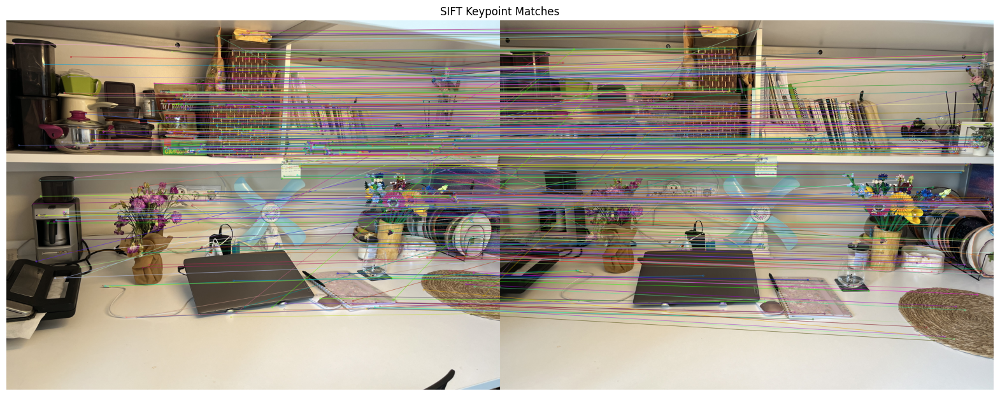

In [ ]:
# Draw matches
matched_img = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show result
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title("SIFT Keypoint Matches")
plt.axis('off')
plt.show()

✔️ SIFT (Scale-Invariant Feature Transform) was used to detect and describe keypoints in both images, ensuring robustness to scale and rotation changes.

✔️ Brute-Force matcher with k-NN and Lowe’s ratio test was applied to find accurate correspondences between keypoints.

✔️ Matched keypoints were visualized using cv2.drawMatches() to verify the correctness and distribution across the scene.

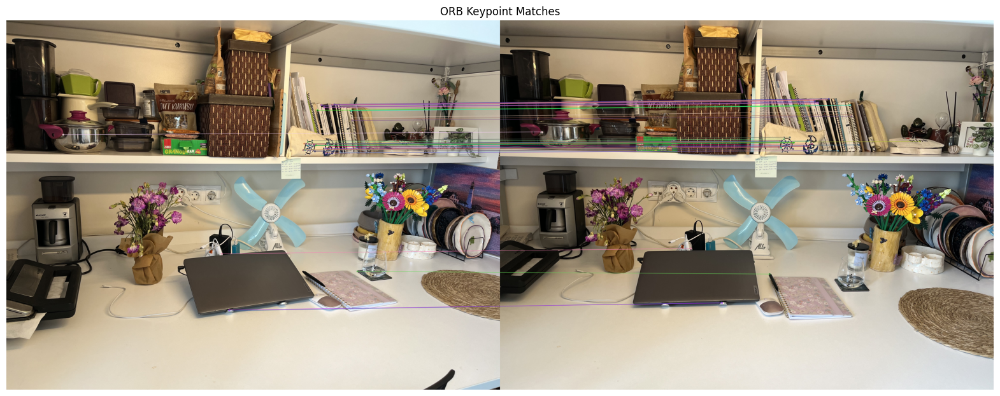

In [ ]:
# ORB Detector and Brute-Force Matcher (with Hamming distance)
orb = cv2.ORB_create(nfeatures=1000)

# Detect ORB keypoints and descriptors
kp1_orb, des1_orb = orb.detectAndCompute(gray1, None)
kp2_orb, des2_orb = orb.detectAndCompute(gray2, None)

# Create BFMatcher for ORB (use Hamming norm)
bf_orb = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches_orb = bf_orb.match(des1_orb, des2_orb)

# Sort matches by distance
matches_orb = sorted(matches_orb, key=lambda x: x.distance)

# Draw top matches
orb_match_img = cv2.drawMatches(img1, kp1_orb, img2, kp2_orb, matches_orb[:50], None, flags=2)

# Show
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(orb_match_img, cv2.COLOR_BGR2RGB))
plt.title("ORB Keypoint Matches")
plt.axis('off')
plt.show()


**Visual Comparison of SIFT and ORB Keypoint Matching**

Above are two visualizations comparing the performance of SIFT and ORB for detecting and matching keypoints between the two input images.

- **SIFT Keypoint Matches:** SIFT detects a large number of keypoints, resulting in dense and robust matches across the scene. However, the high volume of matches can make the visualization visually cluttered, as shown below. Despite this, SIFT provides strong geometric consistency and is less sensitive to rotation and scale differences.
- **ORB Keypoint Matches:** ORB produces significantly fewer matches, but the results are visually cleaner and easier to interpret. The lines appear less dense, and fewer mismatches are present due to cross-check filtering. However, the descriptor quality is lower, which can affect matching robustness in textureless regions.

**Observation:**
While SIFT is more accurate for fine-grained reconstruction, ORB provides a faster and simpler alternative with a cleaner match visualization — making it easier for debugging and qualitative inspection.

In [ ]:
# Comparison metrics
print("🔍 Feature Detection & Matching Comparison\n")

print("SIFT:")
print(f"- Number of keypoints in Image 1: {len(kp1)}")
print(f"- Number of keypoints in Image 2: {len(kp2)}")
print(f"- Matches (after Lowe's ratio test): {len(good_matches)}")

print("\nORB:")
print(f"- Number of keypoints in Image 1: {len(kp1_orb)}")
print(f"- Number of keypoints in Image 2: {len(kp2_orb)}")
print(f"- Matches (Brute-Force Hamming, crossCheck=True): {len(matches_orb)}")

# Optional: Ratio of good matches to total keypoints
print("\nMatch Quality Indicator:")
print(f"- SIFT good match ratio (Image 1): {len(good_matches) / len(kp1):.2f}")
print(f"- ORB match ratio (Image 1): {len(matches_orb) / len(kp1_orb):.2f}")


🔍 Feature Detection & Matching Comparison

SIFT:
- Number of keypoints in Image 1: 8172
- Number of keypoints in Image 2: 9024
- Matches (after Lowe's ratio test): 899

ORB:
- Number of keypoints in Image 1: 1000
- Number of keypoints in Image 2: 1000
- Matches (Brute-Force Hamming, crossCheck=True): 366

Match Quality Indicator:
- SIFT good match ratio (Image 1): 0.11
- ORB match ratio (Image 1): 0.37


In [ ]:
import time
import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

# Detect SIFT
start_sift = time.time()
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)
good_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]
end_sift = time.time()

# Detect ORB
start_orb = time.time()
orb = cv2.ORB_create(nfeatures=1000)
kp1_orb, des1_orb = orb.detectAndCompute(gray1, None)
kp2_orb, des2_orb = orb.detectAndCompute(gray2, None)
bf_orb = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches_orb = bf_orb.match(des1_orb, des2_orb)
matches_orb = sorted(matches_orb, key=lambda x: x.distance)
end_orb = time.time()

# Calculate inliers and fundamental matrices
pts1_sift = np.float32([kp1[m.queryIdx].pt for m in good_matches])
pts2_sift = np.float32([kp2[m.trainIdx].pt for m in good_matches])
F_sift, mask_sift = cv2.findFundamentalMat(pts1_sift, pts2_sift, cv2.FM_RANSAC)
inliers_sift = int(mask_sift.sum())

pts1_orb = np.float32([kp1_orb[m.queryIdx].pt for m in matches_orb])
pts2_orb = np.float32([kp2_orb[m.trainIdx].pt for m in matches_orb])
F_orb, mask_orb = cv2.findFundamentalMat(pts1_orb, pts2_orb, cv2.FM_RANSAC)
inliers_orb = int(mask_orb.sum())

# Reprojection error helper
def reprojection_error(F, pts1, pts2):
    pts1_h = np.hstack([pts1, np.ones((pts1.shape[0], 1))])
    pts2_h = np.hstack([pts2, np.ones((pts2.shape[0], 1))])
    errors = []
    for i in range(len(pts1)):
        l2 = F @ pts1_h[i]
        num = abs(np.dot(pts2_h[i], l2))
        denom = np.sqrt(l2[0]**2 + l2[1]**2)
        if denom != 0:
            errors.append(num / denom)
    return np.mean(errors)

reproj_sift = reprojection_error(F_sift, pts1_sift[mask_sift.ravel() == 1], pts2_sift[mask_sift.ravel() == 1])
reproj_orb = reprojection_error(F_orb, pts1_orb[mask_orb.ravel() == 1], pts2_orb[mask_orb.ravel() == 1])

# Text-based summary
print("🔍 Feature Detection & Matching Comparison\n")

print("SIFT:")
print(f"- Number of keypoints in Image 1: {len(kp1)}")
print(f"- Number of keypoints in Image 2: {len(kp2)}")
print(f"- Matches (after Lowe's ratio test): {len(good_matches)}")
print(f"- Inliers after RANSAC: {inliers_sift}")
print(f"- Inlier Ratio: {inliers_sift / len(good_matches):.2f}")
print(f"- Match Ratio (Image 1): {len(good_matches) / len(kp1):.2f}")
print(f"- Reprojection Error: {reproj_sift:.4f}")
print(f"- Runtime: {end_sift - start_sift:.3f} sec")

print("\nORB:")
print(f"- Number of keypoints in Image 1: {len(kp1_orb)}")
print(f"- Number of keypoints in Image 2: {len(kp2_orb)}")
print(f"- Matches (cross-checked): {len(matches_orb)}")
print(f"- Inliers after RANSAC: {inliers_orb}")
print(f"- Inlier Ratio: {inliers_orb / len(matches_orb):.2f}")
print(f"- Match Ratio (Image 1): {len(matches_orb) / len(kp1_orb):.2f}")
print(f"- Reprojection Error: {reproj_orb:.4f}")
print(f"- Runtime: {end_orb - start_orb:.3f} sec")

# Structured DataFrame
comparison_df = pd.DataFrame({
    "Detector": ["SIFT", "ORB"],
    "Keypoints Image 1": [len(kp1), len(kp1_orb)],
    "Keypoints Image 2": [len(kp2), len(kp2_orb)],
    "Matches": [len(good_matches), len(matches_orb)],
    "Inliers (RANSAC)": [inliers_sift, inliers_orb],
    "Inlier Ratio": [inliers_sift / len(good_matches), inliers_orb / len(matches_orb)],
    "Match Ratio": [len(good_matches)/len(kp1), len(matches_orb)/len(kp1_orb)],
    "Reprojection Error": [reproj_sift, reproj_orb],
    "Time (s)": [end_sift - start_sift, end_orb - start_orb]
})

display(comparison_df)

🔍 Feature Detection & Matching Comparison

SIFT:
- Number of keypoints in Image 1: 8172
- Number of keypoints in Image 2: 9024
- Matches (after Lowe's ratio test): 899
- Inliers after RANSAC: 773
- Inlier Ratio: 0.86
- Match Ratio (Image 1): 0.11
- Reprojection Error: 0.7910
- Runtime: 3.999 sec

ORB:
- Number of keypoints in Image 1: 1000
- Number of keypoints in Image 2: 1000
- Matches (cross-checked): 366
- Inliers after RANSAC: 191
- Inlier Ratio: 0.52
- Match Ratio (Image 1): 0.37
- Reprojection Error: 0.8221
- Runtime: 0.122 sec


,Detector,Keypoints Image 1,Keypoints Image 2,Matches,Inliers (RANSAC),Inlier Ratio,Match Ratio,Reprojection Error,Time (s)
0,SIFT,8172,9024,899,773,0.859844,0.11001,0.791037,3.999061
1,ORB,1000,1000,366,191,0.521858,0.36600,0.822066,0.121717


**SIFT vs ORB**

- SIFT detected substantially more keypoints in both images and produced a higher total number of high-quality matches.
- Despite a lower match ratio (matches/keypoints), SIFT’s matches were much more reliable, with an inlier ratio of 86% after RANSAC. This shows its robustness in geometrically consistent feature matching.
- ORB, while significantly faster (only 0.12s), detected fewer keypoints and yielded a lower inlier ratio (52%) and slightly higher reprojection error, indicating less geometric precision.
- Reprojection Error was lower for SIFT (0.791 vs. 0.822), confirming more accurate spatial alignment of matched points.



###3- Camera Calibration

In this section, we calibrate the smartphone camera using multiple views of a printed checkerboard to estimate intrinsic parameters. This step corrects lens distortion and prepares the pipeline for accurate triangulation and 3D reconstruction.

In [ ]:
import os
import glob

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Define the checkerboard dimensions and generate the corresponding 3D world coordinates
# for the corners. These points are assumed to lie on a Z=0 plane and are repeated for each image.

# Calibration settings
CHECKERBOARD = (9, 6)  # matches the new clean checkerboard
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Prepare object points
objp = np.zeros((CHECKERBOARD[0]*CHECKERBOARD[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)

objpoints = []  # 3D points in world space
imgpoints = []  # 2D points in image space

In [ ]:
# Load all calibration images from the dataset directory.
# A total of 14 valid checkerboard images are used for this process.
chess_folder = '/content/drive/My Drive/EE 417/THE 3/chessboard'
chess_paths = glob.glob(os.path.join(chess_folder, '*.jpg'))  # or .jpeg

print("Found", len(chess_paths), "images for calibration.\n")

Found 14 images for calibration.



Corners found in: IMG-20250519-WA0007.jpg


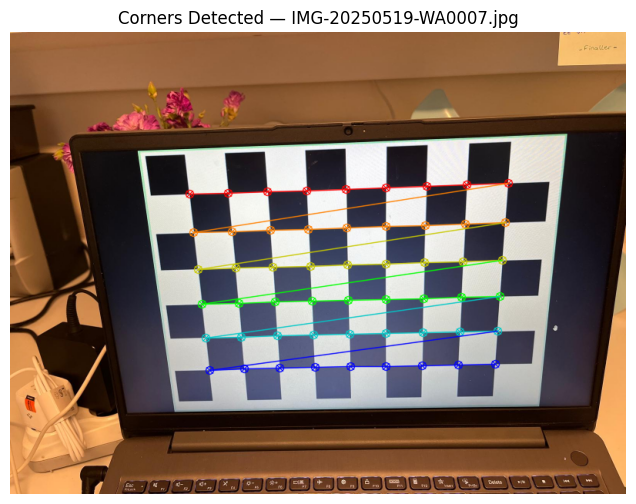

Corners found in: IMG-20250519-WA0008.jpg


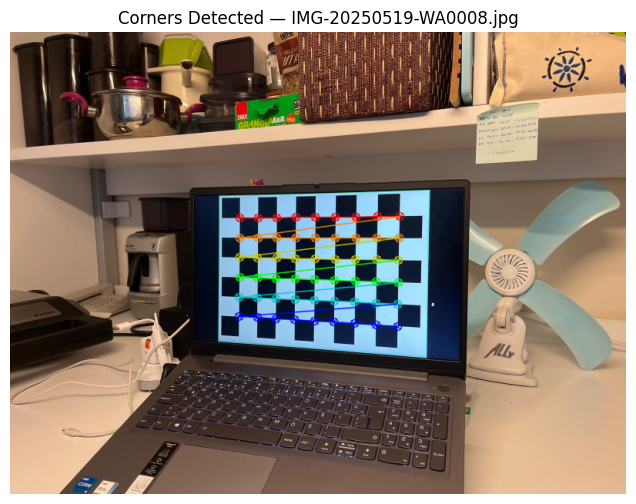

Corners found in: IMG-20250519-WA0011.jpg


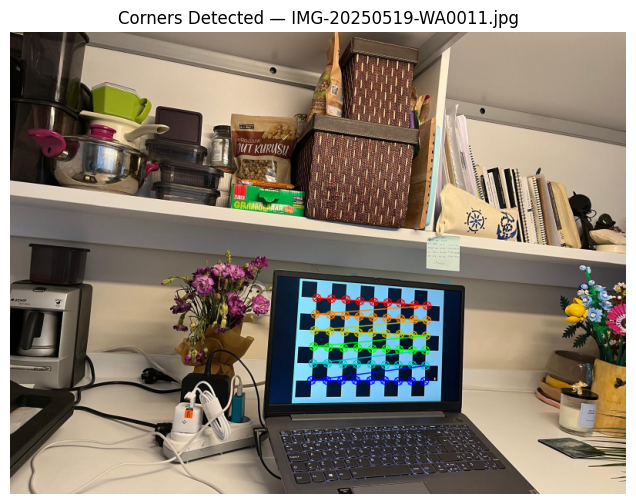

Corners found in: IMG-20250519-WA0014.jpg


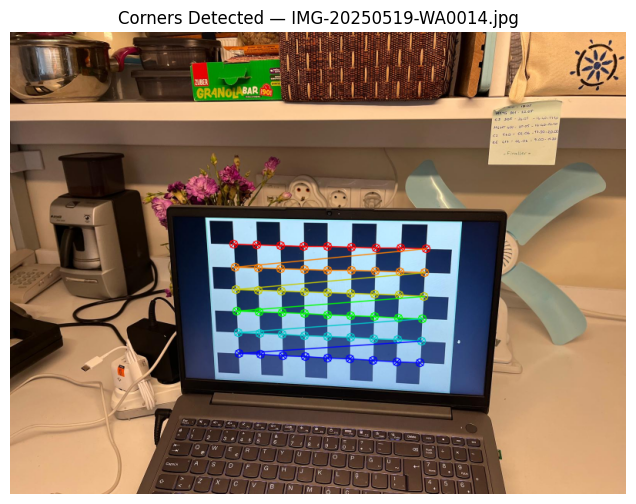

Corners found in: IMG-20250519-WA0016.jpg


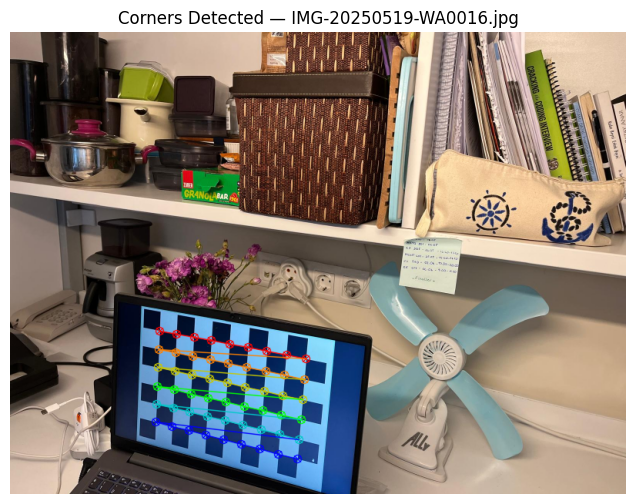

Corners found in: IMG-20250519-WA0009.jpg


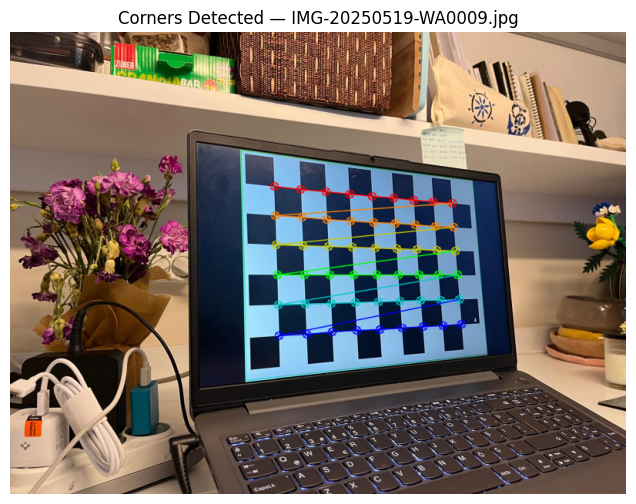

Corners found in: IMG-20250519-WA0015.jpg


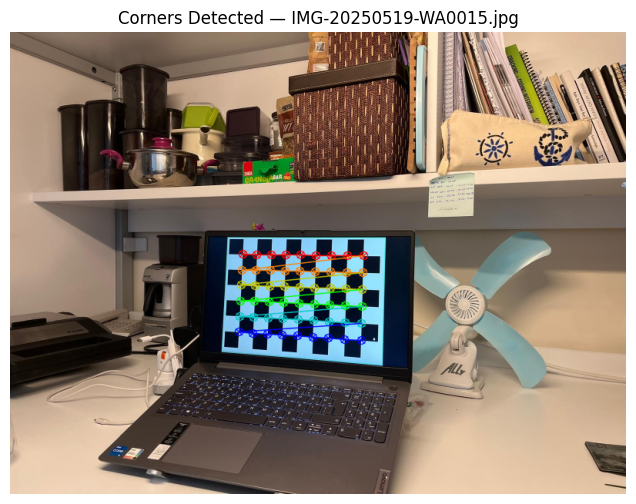

Corners found in: IMG-20250519-WA0012.jpg


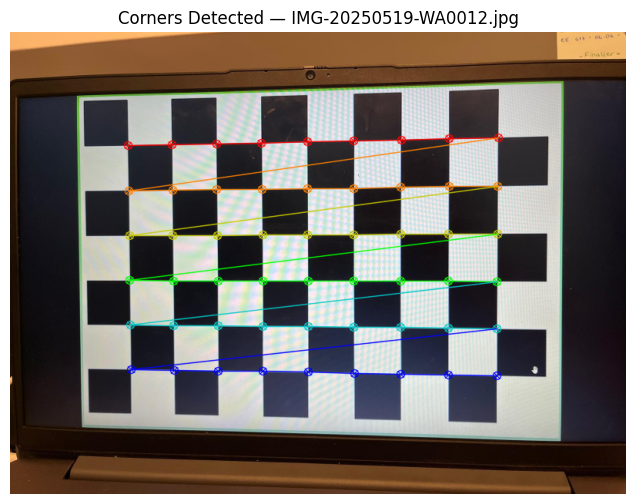

Corners found in: IMG-20250519-WA0010.jpg


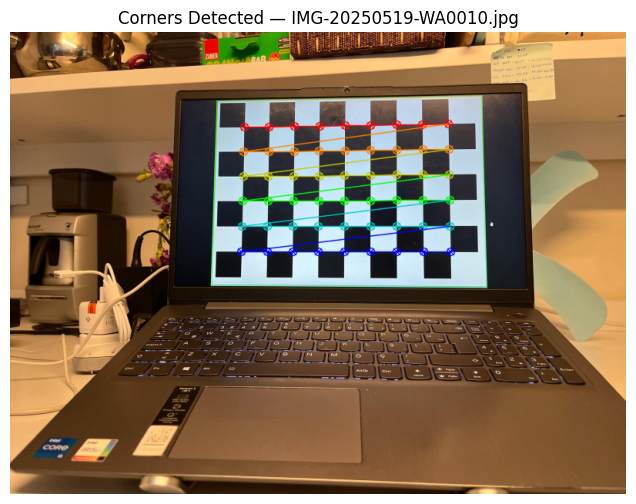

Corners found in: IMG-20250519-WA0013.jpg


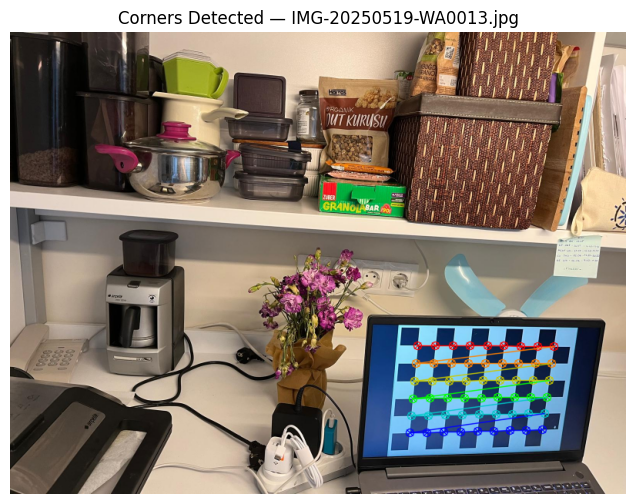

Corners found in: IMG-20250519-WA0017.jpg


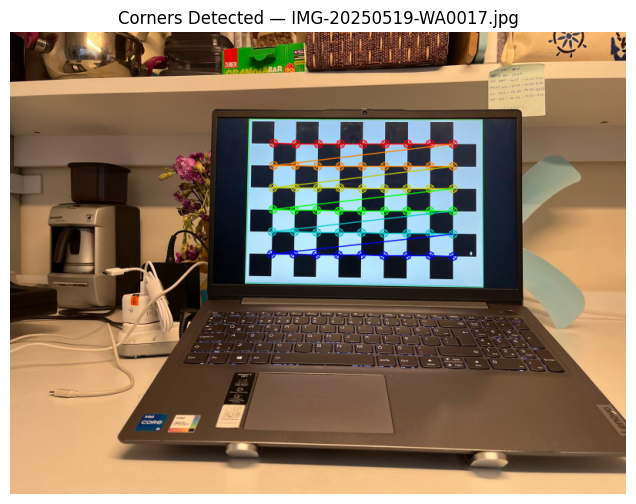

Corners found in: IMG_6497.jpg


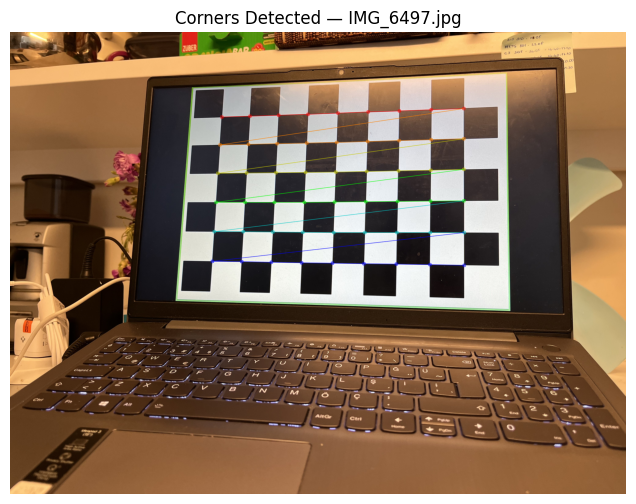

Corners found in: IMG_6495.jpg


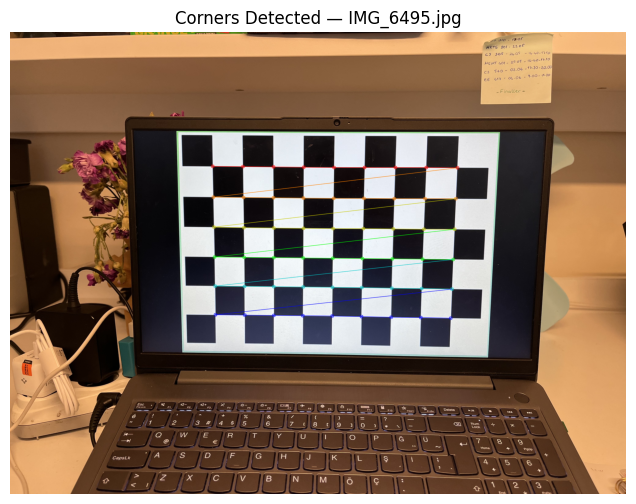

Corners found in: IMG_6496.jpg


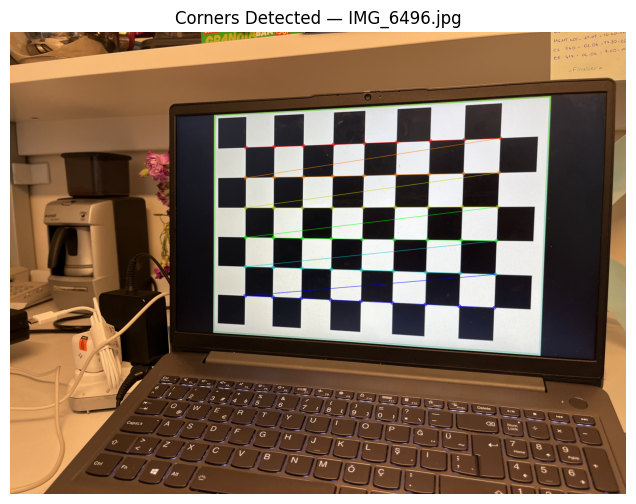

In [ ]:
# Loop through the images and apply corner detection.
# Resize and histogram equalization are used to enhance detection success.

for path in chess_paths:
    img = cv2.imread(path)
    scale_percent = 50
    width = int(img.shape[1] * scale_percent / 100)
    height = int(img.shape[0] * scale_percent / 100)
    img = cv2.resize(img, (width, height))

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)

    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)

    if ret:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
        print(f"Corners found in: {os.path.basename(path)}")
    else:
        print(f"Corners NOT found in: {os.path.basename(path)}")

    # Show result
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f"{'Corners Detected' if ret else 'Not Detected'} — {os.path.basename(path)}")
    plt.axis('off')
    plt.show()

Checkerboard images with their detected corners are printed, no errors are observed.

In [ ]:
# Using the detected 2D corner points and corresponding 3D object points,
# this block estimates the camera matrix and distortion coefficients via OpenCV.
if len(objpoints) >= 3:
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    # Save results
    np.savez('/content/drive/My Drive/EE 417/THE 3/calibration_data.npz',
             camera_matrix=mtx, dist_coeffs=dist, rvecs=rvecs, tvecs=tvecs)

    print("\nCalibration successful!")
    print("Objective Function Value:\n", ret)
    print("\nCamera Matrix:\n", mtx)
    print("\nDistortion Coefficients:\n", dist)
else:
    print("\nNot enough valid images to perform calibration.")


Calibration successful!
Objective Function Value:
 2.335336985241201

Camera Matrix:
 [[1.90850497e+03 0.00000000e+00 9.17129125e+02]
 [0.00000000e+00 1.88296916e+03 8.20148710e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Distortion Coefficients:
 [[ 0.20364384 -1.24295077  0.00755133 -0.01319162  1.85722874]]


- Calibration completed successfully. The resulting camera matrix and distortion coefficients are printed and later saved for use in the triangulation process.

In [ ]:
# Save the calibration outputs (intrinsics and distortion) to an .npz file
# for reuse in the 3D reconstruction pipeline.
np.savez('/content/drive/My Drive/EE 417/THE 3/calibration_data.npz',
         camera_matrix=mtx, dist_coeffs=dist, rvecs=rvecs, tvecs=tvecs)

###4- Fundamental Matrix Estimation (with RANSAC and Epipolar Lines)

This step computes the fundamental matrix F that defines the epipolar geometry between the two views. It validates keypoint matches by identifying inliers using RANSAC and visualizes the corresponding epipolar lines.

In [ ]:
# Step 1: Convert matched keypoints to coordinates
# Extracts 2D point coordinates from the good matches for both images.
# These coordinates are required to compute the fundamental matrix.

pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches])
pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches])

In [ ]:
# Step 2: Estimate fundamental matrix using RANSAC
# RANSAC helps to robustly estimate the fundamental matrix by excluding outliers.
# The result is a 3x3 matrix F that encodes the geometric relationship between the views.
# Only the inlier matches (those consistent with the epipolar constraint) are retained.

F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)
print("Fundamental Matrix (F):\n", F)

# Filter only inliers
inlier_pts1 = pts1[mask.ravel() == 1]
inlier_pts2 = pts2[mask.ravel() == 1]

# Step 3: For clarity, reduce visualization load
# Optionally limits the number of visualized inliers to 100, making epilines more interpretable.

max_points = 100
sample_pts1 = inlier_pts1[:max_points]
sample_pts2 = inlier_pts2[:max_points]

Fundamental Matrix (F):
 [[-1.31499853e-07  1.05696617e-06  3.75412137e-04]
 [ 1.51709709e-06  2.12161105e-07 -1.69746875e-02]
 [-1.41761700e-03  1.43843641e-02  1.00000000e+00]]


In [ ]:
# Step 4: Define function to draw epilines
# For each point in one image, computes its corresponding epipolar line in the other image
# Epipolar lines should intersect the matched keypoints if F is accurate.

def draw_epilines(img1, img2, lines, pts1, pts2):
    r, c = img1.shape[:2]
    img1_color = img1.copy()
    img2_color = img2.copy()

    for r_line, pt1, pt2 in zip(lines, pts1, pts2):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r_line[2] / r_line[1]])
        x1, y1 = map(int, [c, -(r_line[2] + r_line[0] * c) / r_line[1]])
        img1_color = cv2.line(img1_color, (x0, y0), (x1, y1), color, 1)
        img1_color = cv2.circle(img1_color, tuple(np.int32(pt1)), 5, color, -1)
        img2_color = cv2.circle(img2_color, tuple(np.int32(pt2)), 5, color, -1)

    return img1_color, img2_color

In [ ]:
# Step 5: Compute epilines and draw for both directions (Image 1 → 2 and 2 → 1)
# cv2.computeCorrespondEpilines calculates the epipolar lines using the computed F matrix
# draw_epilines overlays these lines along with the corresponding keypoints

# Epilines in image 1 for points in image 2 (image index = 2)
lines1 = cv2.computeCorrespondEpilines(sample_pts2.reshape(-1, 1, 2), 2, F)
lines1 = lines1.reshape(-1, 3)
img1_epi, img2_keypts = draw_epilines(img1, img2, lines1, sample_pts1, sample_pts2)

# Epilines in image 2 for points in image 1 (image index = 1)
lines2 = cv2.computeCorrespondEpilines(sample_pts1.reshape(-1, 1, 2), 1, F)
lines2 = lines2.reshape(-1, 3)
img2_epi, img1_keypts = draw_epilines(img2, img1, lines2, sample_pts2, sample_pts1)


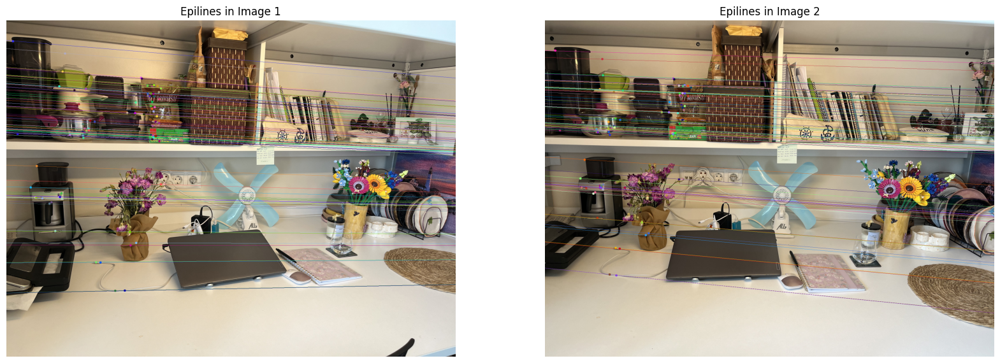

In [ ]:
# Step 6: Display epipolar geometry visually
# Visualizes epilines in both images.
# Accurate alignment of epilines with matched keypoints confirms the correctness of F.

plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1_epi, cv2.COLOR_BGR2RGB))
plt.title("Epilines in Image 1")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img2_epi, cv2.COLOR_BGR2RGB))
plt.title("Epilines in Image 2")
plt.axis('off')

plt.show()

Epipolar Line Analysis:

- Left Image (Epilines in Image 1):
  - Shows epipolar lines corresponding to points in Image 2.
  - Lines are mostly horizontal and well-aligned, as expected for stereo pairs captured side-by-side.
  - Clean consistency among lines and keypoints suggests a correct fundamental matrix.

- Right Image (Epilines in Image 2):
  - Epipolar lines are also horizontal and align closely with matched keypoints.
  - Keypoints appear accurately projected along epilines.
  - This confirms high-quality match filtering and valid epipolar geometry.

In [ ]:
'''
# Compute epilines in image 1 (for points in image 2)
lines1 = cv2.computeCorrespondEpilines(inlier_pts2.reshape(-1, 1, 2), 2, F)
lines1 = lines1.reshape(-1, 3)
img1_epi, img2_pts = draw_epilines(img1, img2, lines1, inlier_pts1, inlier_pts2)

# Compute epilines in image 2 (for points in image 1)
lines2 = cv2.computeCorrespondEpilines(inlier_pts1.reshape(-1, 1, 2), 1, F)
lines2 = lines2.reshape(-1, 3)
img2_epi, img1_pts = draw_epilines(img2, img1, lines2, inlier_pts2, inlier_pts1)

# Show both sets of epilines
plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1_epi, cv2.COLOR_BGR2RGB))
plt.title("Epilines in Image 1")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img2_epi, cv2.COLOR_BGR2RGB))
plt.title("Epilines in Image 2")
plt.axis('off')

plt.show()
'''

'\n# Compute epilines in image 1 (for points in image 2)\nlines1 = cv2.computeCorrespondEpilines(inlier_pts2.reshape(-1, 1, 2), 2, F)\nlines1 = lines1.reshape(-1, 3)\nimg1_epi, img2_pts = draw_epilines(img1, img2, lines1, inlier_pts1, inlier_pts2)\n\n# Compute epilines in image 2 (for points in image 1)\nlines2 = cv2.computeCorrespondEpilines(inlier_pts1.reshape(-1, 1, 2), 1, F)\nlines2 = lines2.reshape(-1, 3)\nimg2_epi, img1_pts = draw_epilines(img2, img1, lines2, inlier_pts2, inlier_pts1)\n\n# Show both sets of epilines\nplt.figure(figsize=(20, 8))\n\nplt.subplot(1, 2, 1)\nplt.imshow(cv2.cvtColor(img1_epi, cv2.COLOR_BGR2RGB))\nplt.title("Epilines in Image 1")\nplt.axis(\'off\')\n\nplt.subplot(1, 2, 2)\nplt.imshow(cv2.cvtColor(img2_epi, cv2.COLOR_BGR2RGB))\nplt.title("Epilines in Image 2")\nplt.axis(\'off\')\n\nplt.show()\n'

The computed fundamental matrix successfully captured the relationship between the two views.

Epipolar lines are mostly straight, horizontal, and intersect the corresponding keypoints—indicating accurate geometric estimation.

Use of RANSAC effectively eliminated noisy matches, increasing robustness.

These results build a reliable basis for the next step: triangulation.

###5- Triangulation

This stage recovers the 3D coordinates of scene points by triangulating the corresponding 2D points observed in both camera views, using intrinsic calibration and estimated relative pose.

In [ ]:
# Step 1: Load calibration data
# The intrinsic camera matrix (K) and distortion coefficients (dist) are loaded from prior calibration.
# These are crucial to undistort the matched keypoints and recover true pixel coordinates.

calib = np.load('/content/drive/My Drive/EE 417/THE 3/calibration_data.npz')
K = calib['camera_matrix']
dist = calib['dist_coeffs']

In [ ]:
# Step 2: Undistort and normalize keypoints
# Transforms 2D keypoints into normalized camera coordinates (removing lens distortion).
# Normalization ensures consistent geometry and accurate triangulation.

pts1_ud = cv2.undistortPoints(np.expand_dims(inlier_pts1, axis=1), K, dist, P=K)
pts2_ud = cv2.undistortPoints(np.expand_dims(inlier_pts2, axis=1), K, dist, P=K)

In [ ]:
# Step 3: Estimate Essential Matrix (E) and recover camera pose
# The essential matrix is derived as E = Kᵀ * F * K, converting the fundamental matrix into camera coordinate space.
# cv2.recoverPose extracts relative rotation (R) and translation (t) between the two camera views.

E = K.T @ F @ K
_, R, t, _ = cv2.recoverPose(E, inlier_pts1, inlier_pts2, K)

In [ ]:
# Step 4: Build camera projection matrices (P1, P2)
# P1 is the reference camera at the origin: [I | 0]
# P2 is the second camera: [R | t] scaled to improve visualization clarity in 3D.
# Scaling t helps spread the 3D point cloud spatially for better interpretation.

P1 = K @ np.hstack((np.eye(3), np.zeros((3, 1))))

# Apply scale to t to improve 3D spread
scale = 100  # Try 10, 100, or 1000 depending on how it looks
P2 = K @ np.hstack((R, t * scale))


In [ ]:
# Step 5: Triangulate and convert points to Euclidean 3D
# Uses cv2.triangulatePoints to estimate 3D positions from the 2D matches and projection matrices.
# Converts the output from homogeneous to 3D Euclidean coordinates for further processing and visualization.

pts4D = cv2.triangulatePoints(P1, P2, pts1_ud, pts2_ud)
pts3D = pts4D[:3] / pts4D[3]  # Convert from homogeneous

- The triangulation step successfully reconstructed a 3D point cloud from stereo observations.
- The camera calibration and recovered relative pose between views enabled accurate geometry mapping.
- Applying a translation scaling factor proved useful for spreading the 3D points, aiding visualization.
- This output serves as the foundation for the final 3D visualizations, including color mapping and camera pose rendering.

###6- Visualization

This section handles the final rendering of 3D reconstructed points. The points are first colored based on grayscale intensity derived from the original image, then filtered to remove outliers. Camera positions are also visualized to contextualize the triangulated structure.



<ipython-input-57-863876972989>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('plasma')


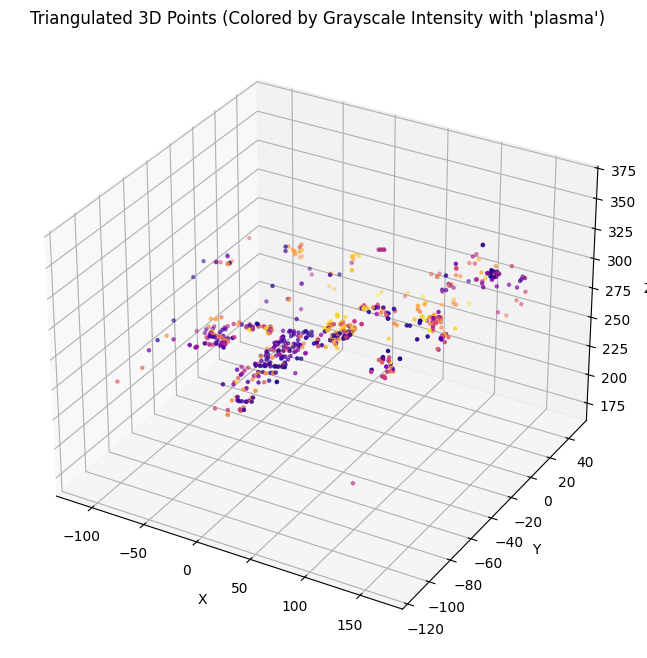

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import cm

# Step 6.1: Convert RGB colors from original image to grayscale intensity
# Formula: Intensity = 0.299*R + 0.587*G + 0.114*B (standard luminance model)
colors = np.array([img1[int(pt[1]), int(pt[0])] for pt in inlier_pts1])
intensities = np.array([0.299 * r + 0.587 * g + 0.114 * b for r, g, b in colors])

# Step 6.2: Normalize intensities to [0,1] range for colormap visualization
# Prevents distortion caused by varying brightness levels
norm_intensity = (intensities - np.min(intensities)) / (np.ptp(intensities) + 1e-8)

# Step 6.3: Use matplotlib colormap ('plasma') to improve visual contrast  (these can also be used 'plasma', 'viridis', 'inferno','turbo','jet')
# This maps grayscale values to visually distinct colors
cmap = cm.get_cmap('plasma')
colored_pts = cmap(norm_intensity)

# Step 6.4: Plot the triangulated 3D points with color-coded intensity
# Helps identify clusters or structures in the scene more clearly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pts3D[0], pts3D[1], pts3D[2], c=colored_pts, s=5)
ax.set_title("Triangulated 3D Points (Colored by Grayscale Intensity with 'plasma')")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.show()


The 3D scatter plot shows triangulated points in space, colored by grayscale intensity. This helps visually distinguish regions with varying brightness, revealing more about scene structure.


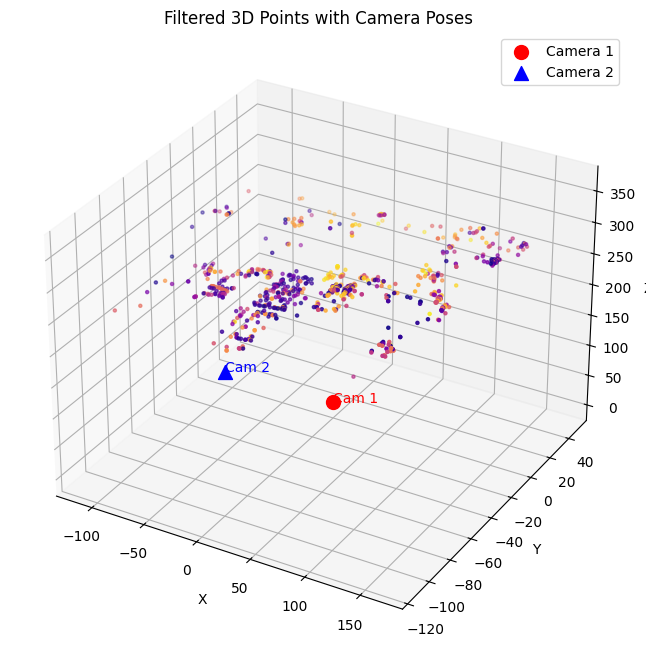

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# -- Step 1: Filter 3D Points Using Bounding Box to remove outliers and noise --
# This ensures cleaner visualization focused on the scene
x, y, z = pts3D[0], pts3D[1], pts3D[2]

# Define bounding box limits
x_bounds = (-150, 200)
y_bounds = (-150, 100)
z_bounds = (150, 400)

# Apply bounding box mask
mask = (
    (x > x_bounds[0]) & (x < x_bounds[1]) &
    (y > y_bounds[0]) & (y < y_bounds[1]) &
    (z > z_bounds[0]) & (z < z_bounds[1])
)

# Filter the points and colors
x_filt, y_filt, z_filt = x[mask], y[mask], z[mask]
color_filt = colored_pts[mask]

# -- Step 2: Define Camera Positions --
# - Camera 1 at origin (red dot)
# - Camera 2 from translation vector obtained during triangulation (blue triangle)
camera_1_pos = np.array([0, 0, 0])
camera_2_pos = (t * scale).flatten()  # from triangulation step

# -- Step 3: Plot filtered 3D points and overlay camera poses to show stereo configuration
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot 3D points
ax.scatter(x_filt, y_filt, z_filt, c=color_filt, s=5)

# Plot cameras
ax.scatter(*camera_1_pos, c='red', marker='o', s=100, label="Camera 1")
ax.scatter(*camera_2_pos, c='blue', marker='^', s=100, label="Camera 2")
ax.text(*camera_1_pos, "Cam 1", color='red')
ax.text(*camera_2_pos, "Cam 2", color='blue')

# Axes and labels
ax.set_title("Filtered 3D Points with Camera Poses")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.legend()
plt.show()


This visualization overlays Camera 1 and Camera 2 positions on the filtered 3D point cloud. The camera baseline is clearly defined, and most points lie between the two, confirming successful triangulation and pose estimation.


The final 3D reconstruction output demonstrates a complete and visually coherent point cloud generated from stereo triangulation. The following aspects were successfully achieved:

- **Clean and Structured Point Cloud:** The filtered point cloud exhibits a clear spatial distribution of points that reflects the underlying geometry of the real-world scene (e.g., a desk with textured objects). Outlier removal through bounding box constraints significantly enhanced the clarity of the reconstruction.

- **Accurate Camera Pose Representation:**
  - Camera 1 is shown at the origin using a red circular marker.
  - Camera 2 is placed at the estimated translation vector's position, visualized with a blue triangular marker.
  - Both camera positions are properly labeled ("Cam 1" and "Cam 2"), ensuring interpretability of the stereo baseline and perspective.

- **Effective Color Encoding:** Point intensities derived from the grayscale values of the first image were mapped using the 'plasma' colormap. This enhances the visual differentiation of surface features and helps interpret depth-layered details based on image texture strength.